In [37]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob

plt.rcParams['figure.figsize'] = [14, 12]

## Lukcas Kanade Algorithm

The Lucas-Kanade optical flow algorithm is a simple technique which can
provide an estimate of the movement of interesting features in successive
images of a scene. We would like to associate a movement vector (u, v) to
every such ”interesting” pixel in the scene, obtained by comparing the two
consecutive images.

The Lucas-Kanade algorithm makes some implicit assumptions:

- The two images are separated by a small time increment ∆t, in such a
way that objects have not displaced significantly (that is, the algorithm
works best with slow moving objects).

- The images depict a natural scene containing textured objects exhibiting shades of gray (different intensity levels) which change smoothly.

The Lucas–Kanade method assumes that the displacement of the image contents between two nearby instants (frames) is small and approximately constant within a neighborhood of the point p under consideration. Thus the optical flow equation can be assumed to hold for all pixels within a window centered at p. Namely, the local image flow (velocity) vector ${\displaystyle (V_{x},V_{y})}$ must satisfy $$I_{x}(q_{1})V_{x}+I_{y}(q_{1})V_{y}=-I_{t}(q_{1})$$
$$I_{x}(q_{2})V_{x}+I_{y}(q_{2})V_{y}=-I_{t}(q_{2})$$
$${\displaystyle \vdots } \vdots $$
$$I_{x}(q_{n})V_{x}+I_{y}(q_{n})V_{y}=-I_{t}(q_{n})$$

where $q_{1},q_{2},\dots ,q_{n}$ are the pixels inside the window, and $I_{x}(q_{i}),I_{y}(q_{i}),I_{t}(q_{i})$ are the partial derivatives of the image $I$ with respect to position x, y and time t, evaluated at the point $q_{i}$ and at the current time.

These equations can be written in matrix form $Av=b$, where
$${\displaystyle A={\begin{bmatrix}I_{x}(q_{1})&I_{y}(q_{1})\\[10pt]I_{x}(q_{2})&I_{y}(q_{2})\\[10pt]\vdots &\vdots \\[10pt]I_{x}(q_{n})&I_{y}(q_{n})\end{bmatrix}}\quad \quad \quad v={\begin{bmatrix}V_{x}\\[10pt]V_{y}\end{bmatrix}}\quad \quad \quad b={\begin{bmatrix}-I_{t}(q_{1})\\[10pt]-I_{t}(q_{2})\\[10pt]\vdots \\[10pt]-I_{t}(q_{n})\end{bmatrix}}}$$

This system has more equations than unknowns and thus it is usually over-determined. The Lucas–Kanade method obtains a compromise solution by the least squares principle. Namely, it solves the 2×2 system
$$A^{T}Av=A^{T}b$$
$${\mathrm  {v}}=(A^{T}A)^{{-1}}A^{T}b$$

That is, it computes
$${\begin{bmatrix}V_{x}\\[10pt]V_{y}\end{bmatrix}}={\begin{bmatrix}\sum _{i}I_{x}(q_{i})^{2}&\sum _{i}I_{x}(q_{i})I_{y}(q_{i})\\[10pt]\sum _{i}I_{y}(q_{i})I_{x}(q_{i})&\sum _{i}I_{y}(q_{i})^{2}\end{bmatrix}}^{{-1}}{\begin{bmatrix}-\sum _{i}I_{x}(q_{i})I_{t}(q_{i})\\[10pt]-\sum _{i}I_{y}(q_{i})I_{t}(q_{i})\end{bmatrix}}$$

In [2]:
def lucas_kadane(frame1, frame2, win = 2):
    Ix = np.zeros(frame1.shape, dtype=np.float32)
    Iy = np.zeros(frame1.shape, dtype=np.float32)
    It = np.zeros(frame1.shape, dtype=np.float32)
    Ix[1:-1, 1:-1] = cv2.subtract(frame1[1:-1, 2:], frame1[1:-1, :-2]) / 2
    Iy[1:-1, 1:-1] = cv2.subtract(frame1[2:, 1:-1], frame1[:-2, 1:-1]) / 2
    It[1:-1, 1:-1] = cv2.subtract(frame1[1:-1, 1:-1], frame2[1:-1, 1:-1])

    params = np.zeros(frame1.shape + (5,))
    params[..., 0] = Ix ** 2
    params[..., 1] = Iy ** 2
    params[..., 2] = Ix * Iy
    params[..., 3] = Ix * It
    params[..., 4] = Iy * It
    del It, Ix, Iy
    cum_params = np.cumsum(np.cumsum(params, axis=0), axis=1)
    del params
    win_params = (cum_params[2 * win + 1:, 2 * win + 1:] -
                  cum_params[2 * win + 1:, :-1 - 2 * win] -
                  cum_params[:-1 - 2 * win, 2 * win + 1:] +
                  cum_params[:-1 - 2 * win, :-1 - 2 * win])
    del cum_params
    op_flow = np.zeros(frame1.shape + (2,))
    det = win_params[...,0] * win_params[..., 1] - win_params[..., 2] **2

    op_flow_x = np.where(det != 0,
                         (win_params[..., 1] * win_params[..., 3] -
                          win_params[..., 2] * win_params[..., 4]) / det,
                         0)
    op_flow_y = np.where(det != 0,
                         (win_params[..., 0] * win_params[..., 4] -
                          win_params[..., 2] * win_params[..., 3]) / det,
                         0)
    op_flow[win + 1: -1 - win, win + 1: -1 - win, 0] = op_flow_x[:-1, :-1]
    op_flow[win + 1: -1 - win, win + 1: -1 - win, 1] = op_flow_y[:-1, :-1]
    op_flow = op_flow.astype(np.float32)
    return op_flow

### Draw Flow

In [3]:
def draw_flow(img, flow, show=True):
    x = np.arange(0, img.shape[1], 1)
    y = np.arange(0, img.shape[0], 1)
    x, y = np.meshgrid(x, y)
    plt.figure()
    fig = plt.imshow(img, cmap='gray', interpolation='bicubic')
    plt.axis('off')
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
    step = img.shape[0] // 20
    plt.quiver(x[::step, ::step], y[::step, ::step],
               flow[::step, ::step, 0], flow[::step, ::step, 1],
               color='r', pivot='middle', headwidth=2, headlength=3)
    if show:
        plt.show()

#### Illustration of optical flow on first set of image

In [10]:
img11 = cv2.imread('eval-gray-twoframes/eval-data-gray/Army/frame10.png', 0)
img12 = cv2.imread('eval-gray-twoframes/eval-data-gray/Army/frame11.png', 0)

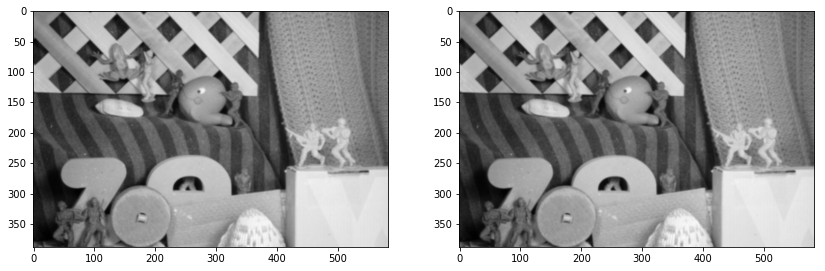

In [11]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(img11, cmap='gray', interpolation='bicubic')
ax[1].imshow(img12, cmap='gray', interpolation='bicubic')

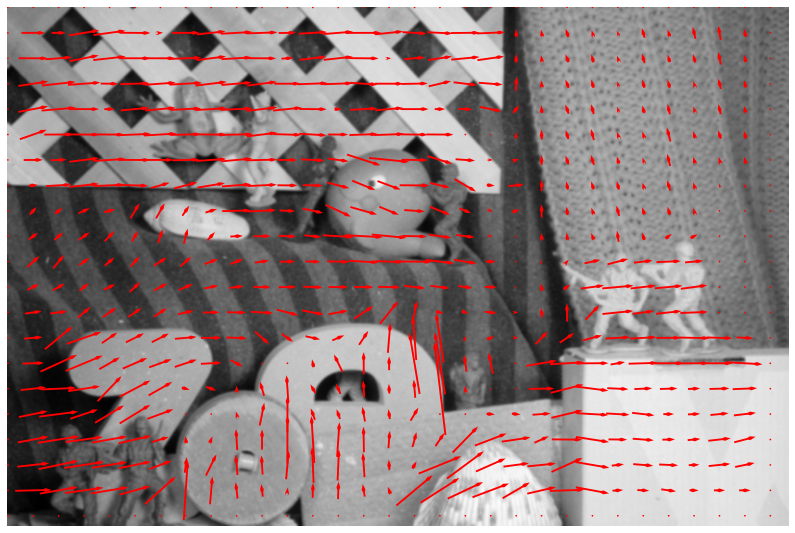

In [12]:
flow1 = lucas_kadane(img11,img12, win=15)
draw_flow(img11, flow1)

#### Illustration of optical flow on second set of image

In [50]:
img21 = cv2.imread('eval-gray-twoframes/eval-data-gray/Basketball//frame10.png', 0)
img22 = cv2.imread('eval-gray-twoframes/eval-data-gray/Basketball//frame11.png', 0)

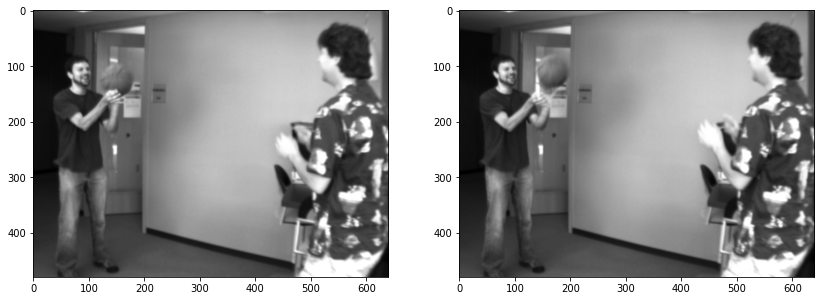

In [51]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(img21, cmap='gray', interpolation='bicubic')
ax[1].imshow(img22, cmap='gray', interpolation='bicubic')

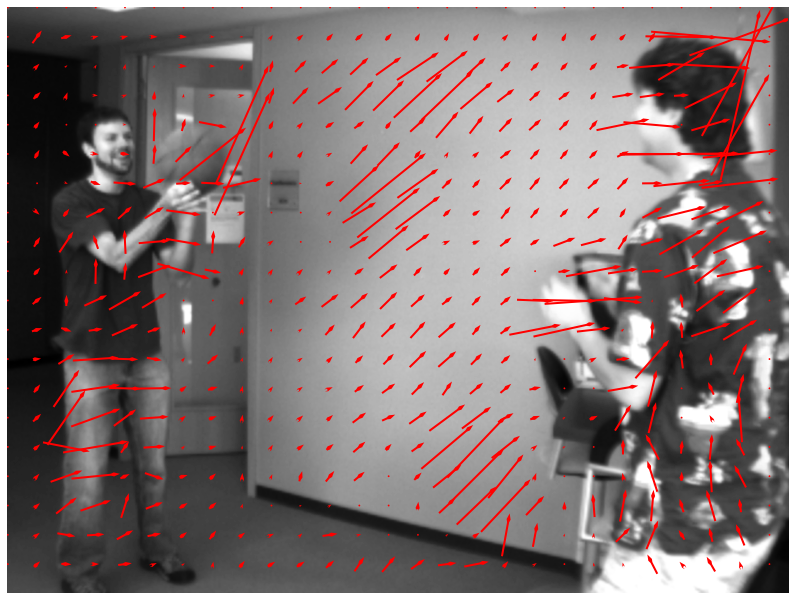

In [57]:
flow2 = lucas_kadane(img21,img22, win=15)
draw_flow(img21, flow2)

#### Illustration of optical flow on third set of image

In [55]:
img31 = cv2.imread('eval-gray-twoframes/eval-data-gray/Backyard//frame10.png', 0)
img32 = cv2.imread('eval-gray-twoframes/eval-data-gray/Backyard//frame11.png', 0)

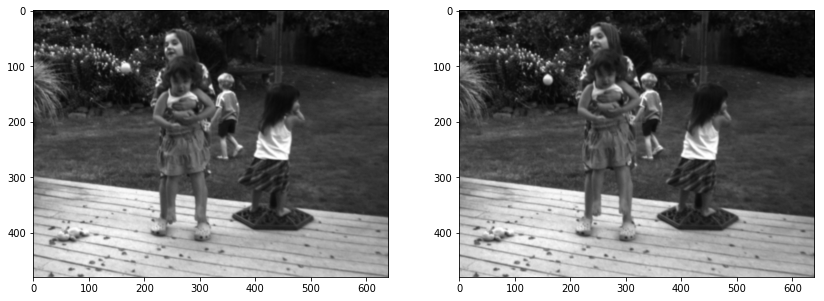

In [56]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(img31, cmap='gray', interpolation='bicubic')
ax[1].imshow(img32, cmap='gray', interpolation='bicubic')

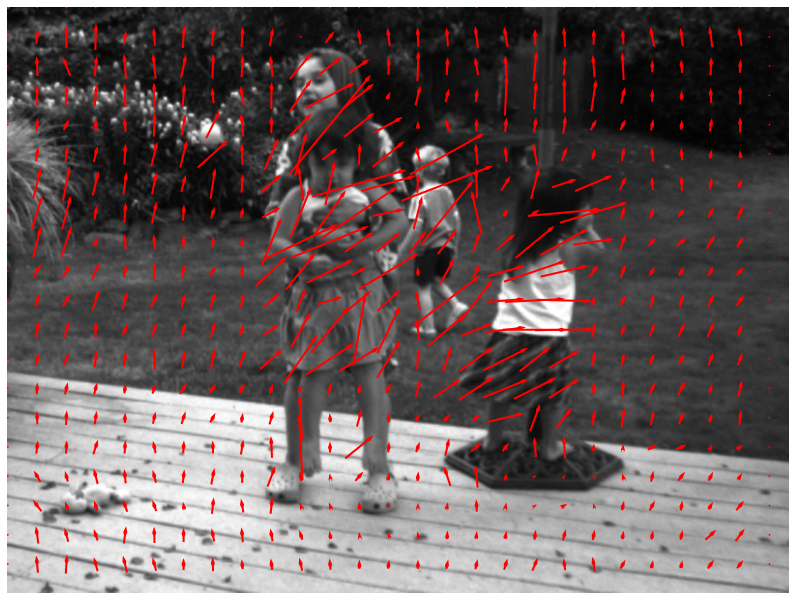

In [59]:
flow3 = lucas_kadane(img31,img32, win=15)
draw_flow(img31, flow3)

#### Illustration of optical flow on first set of image

In [60]:
img41 = cv2.imread('eval-gray-twoframes/eval-data-gray/Teddy/frame10.png', 0)
img42 = cv2.imread('eval-gray-twoframes/eval-data-gray/Teddy/frame11.png', 0)

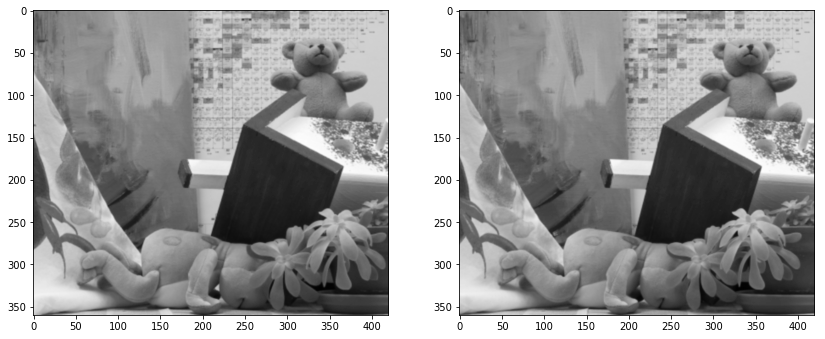

In [61]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(img41, cmap='gray', interpolation='bicubic')
ax[1].imshow(img42, cmap='gray', interpolation='bicubic')

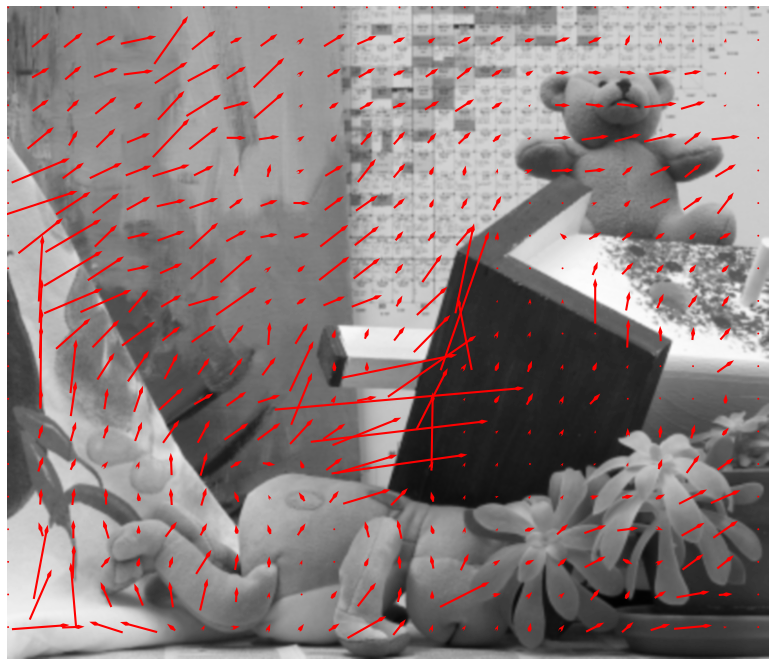

In [62]:
flow4 = lucas_kadane(img41,img42, win=15)
draw_flow(img41, flow4)

#### Illustration of optical flow on first set of image

In [63]:
img51 = cv2.imread('eval-gray-twoframes/eval-data-gray/Schefflera/frame10.png', 0)
img52 = cv2.imread('eval-gray-twoframes/eval-data-gray/Schefflera/frame11.png', 0)

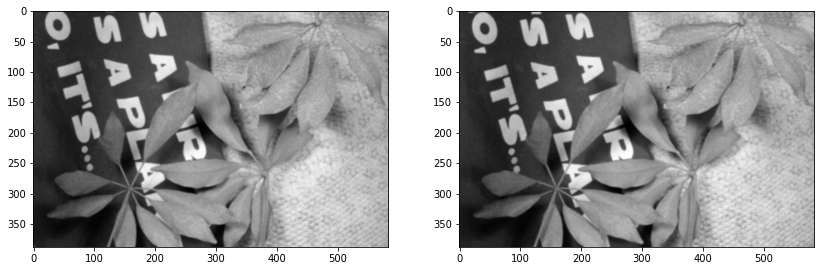

In [64]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(img51, cmap='gray', interpolation='bicubic')
ax[1].imshow(img52, cmap='gray', interpolation='bicubic')

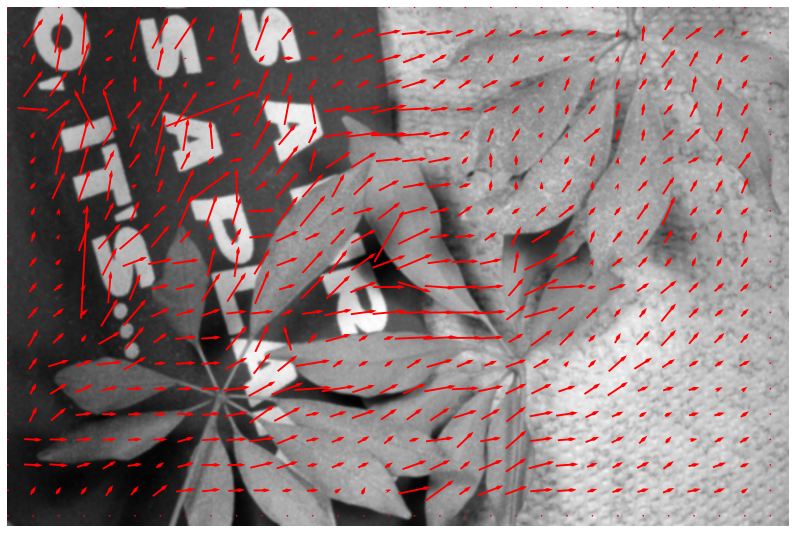

In [65]:
flow5 = lucas_kadane(img51,img52, win=15)
draw_flow(img51, flow5)

## Optical Flow to detect and segment moving objects in a video frame

To detect and segment moving objects in a frame, algorithm is:
- Find magnitude and angle of flow
- Convert hsv[...,0] to ang*180/np.pi/2, where hsv is array with shape of input frame and ang is angle for flow
- Convert hsv[...,1] to 255
- Convert hsv[...,2] to normalized magnitude
- Convert this hsv to BGR form and return the image

### Detect and segment moving objects

In [3]:
def draw_hsv(flow, img):
    hsv = np.zeros_like(img)
    mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
    hsv[...,0] = ang*180/np.pi/2
    hsv[...,1] = 255
    hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
    bgr = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)
    #cv2.imshow('hsv', bgr)
    return bgr

### Results

In [76]:
imageshsv = [cv2.imread(file) for file in glob.glob('output/imagehsv/*.png')]

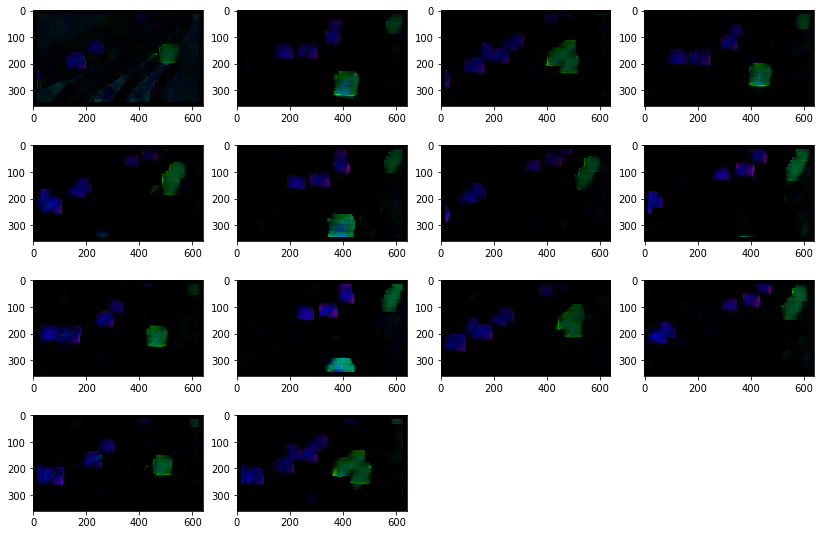

In [77]:
w=10
h=10
fig=plt.figure(figsize=(14, 12))
columns = 4
rows = 5
for i in range(0, len(imageshsv)):
    img = np.random.randint(10, size=(h,w))
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(imageshsv[i])
plt.show()

## Optical Flow to track moving objects in a video frame

To track moving objects, the algorithm used is:
- Segment the moving object first 
- Use cv2.threshold to check pixels that has value above cv2.THRESH_BINARY
- Dilate this thresh image
- Find contour in this threshold image
- For each contour if the bounding box has width and height than 15 we draw the bounding box around the moving object

In [75]:
def track_moving_objects(frame, flow):
    hsv1 = draw_hsv(flow, prev)
    gray1 = cv2.cvtColor(hsv1, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(gray1, 25, 0xFF,
                            cv2.THRESH_BINARY)[1]
    thresh = cv2.dilate(thresh, None, iterations=2)
    gray2, cnts, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for c in cnts:
        (x, y, w, h) = cv2.boundingRect(c)
        if w > 15 and h > 15 and w < 900 and h < 680:
                cv2.rectangle(vis, (x, y), (x + w, y + h), (0, 0xFF, 0), 4)

In [78]:
imagestrack = [cv2.imread(file) for file in glob.glob('output/imagetrack/*.png')]

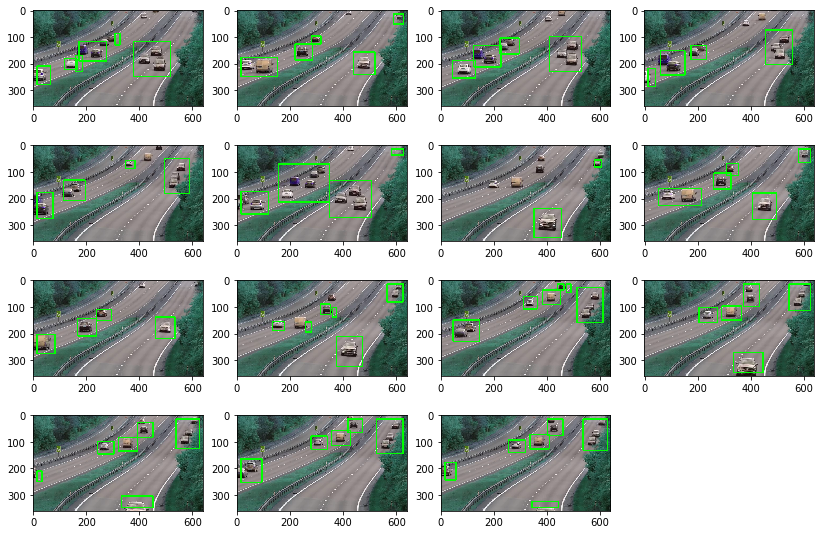

In [79]:
w=10
h=10
fig=plt.figure(figsize=(14, 12))
columns = 4
rows = 5
for i in range(0, len(imagestrack)):
    img = np.random.randint(10, size=(h,w))
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(imagestrack[i])
plt.show()

## Analyze how does your algorithm work when camera is moving.

Observation when camera is moving:
    - The camera movement leads to movement of whole frame captured by the camera
    - This leads to optical flow being observed in whole frame
    - Image segmentation isn't that good, because even the background is moving
    - Tracking foreground moving objects is difficult because even the background is seen moving

### Results

#### Optical flow

In [45]:
imagesflow = [cv2.imread(file) for file in glob.glob('output/imageflow/*.png')]

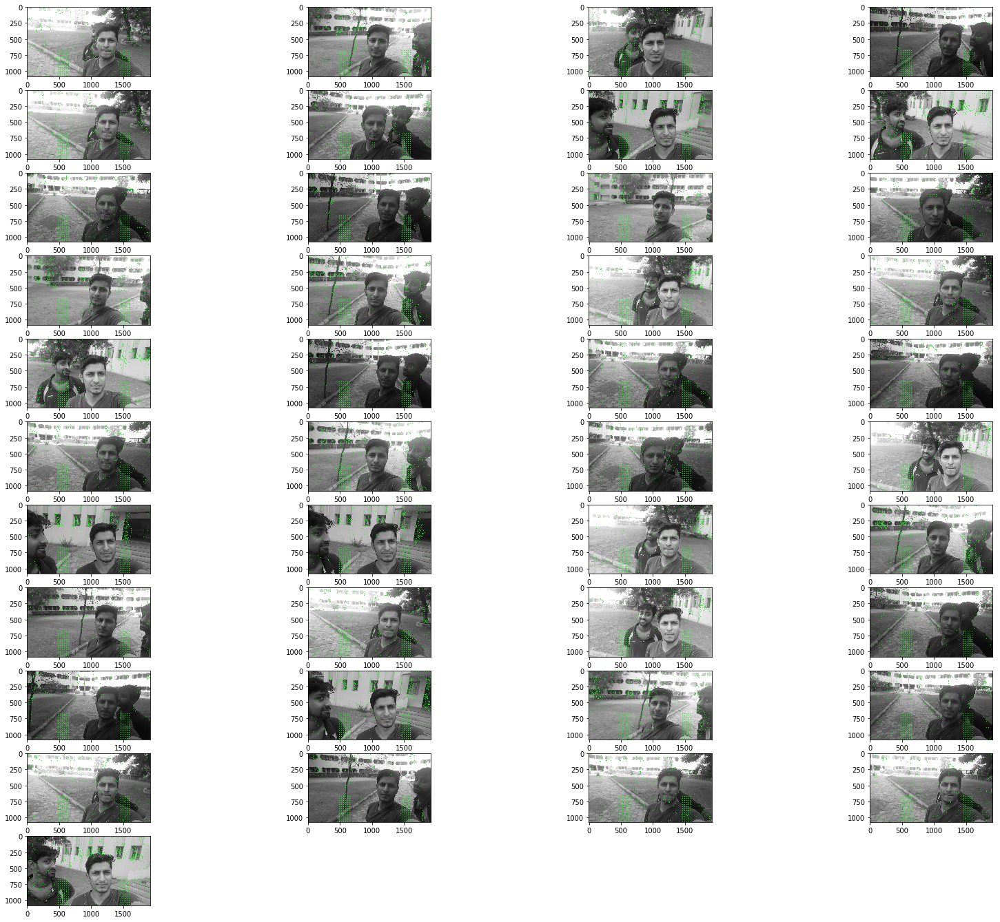

In [51]:
w=25
h=25
fig=plt.figure(figsize=(28, 24))
columns = 4
rows = (len(imagesflow)//4 + 1)
for i in range(0, len(imagesflow)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(imagesflow[i])
plt.show()

#### Image segmentation

In [52]:
imageshsv = [cv2.imread(file) for file in glob.glob('output/imagehsv/*.png')]

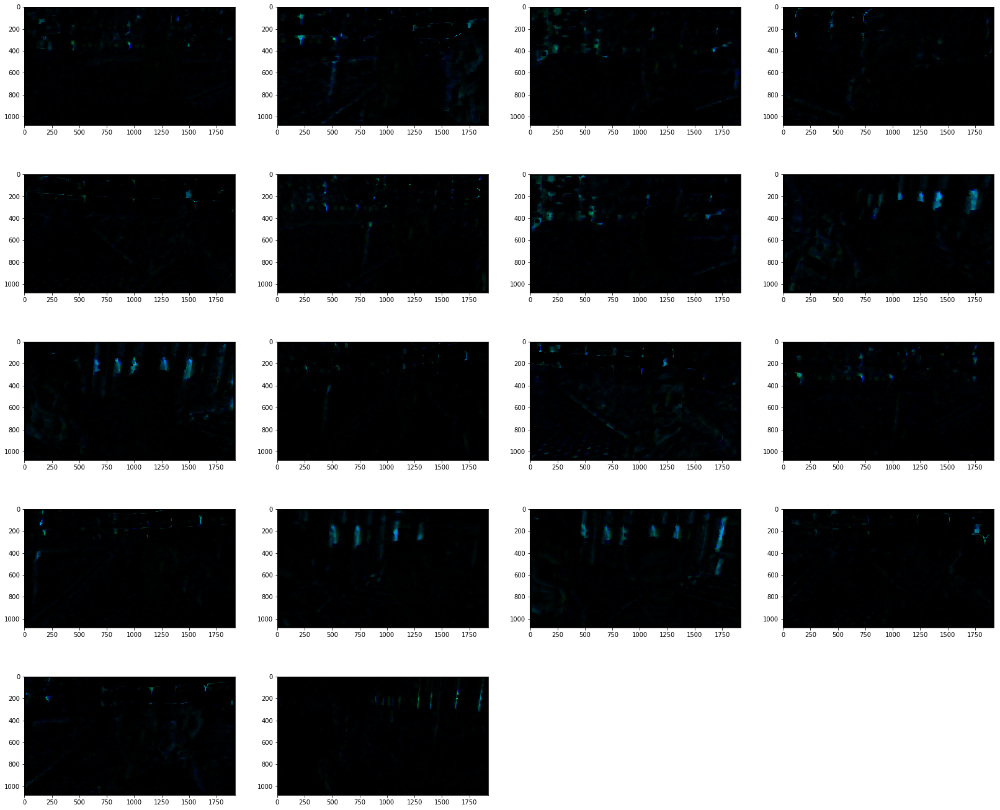

In [53]:
w=25
h=25
fig=plt.figure(figsize=(28, 24))
columns = 4
rows = (len(imageshsv)//4 +1)
for i in range(0, len(imageshsv)):
    img = np.random.randint(10, size=(h,w))
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(imageshsv[i])
plt.show()

#### Tracking moving objects

In [62]:
imagestrack = [cv2.imread(file) for file in glob.glob('output/imagetrack/*.png')]

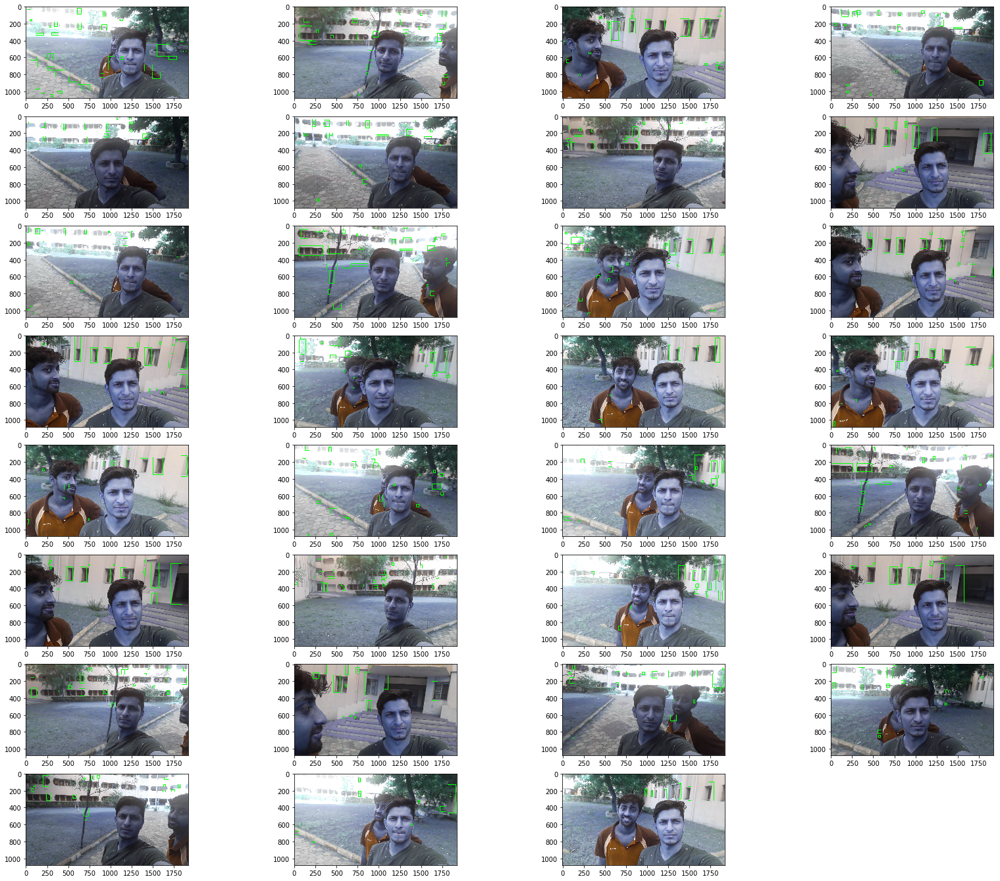

In [63]:
w=25
h=25
fig=plt.figure(figsize=(28, 24))
columns = 4
rows = (len(imagestrack)//4 + 1)
for i in range(0, len(imagestrack)):
    img = np.random.randint(10, size=(h,w))
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(imagestrack[i])
plt.show()